In [1]:
import scprep
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns

import os
import tasklogger
import pickle
import re # regexp
import itertools

import sklearn.cluster
import magic
import umap
import phate
from sklearn.manifold import TSNE
import anndata

import time, os
import scanpy as sc
import scvi
import scarches as sca

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


# Read in datasets

In [2]:
datadir = '../raw_new'

In [3]:
# Updated data with different cell filtering threshold so that ExEM-LCs are removed as they are probably dead cells
adata_micropattern_all = sc.read_h5ad(os.path.join(datadir, 'adata_timeseries_all_v2.h5ad'));
adata_monkey_CS8 = sc.read_h5ad(os.path.join(datadir, 'craig_new_monkey_meta_selected.h5ad'));
adata_human = sc.read_h5ad(os.path.join(datadir, 'human_ref_with_meta.h5ad'));

In [4]:
# Save read counts
adata_micropattern_all.layers['counts'] = adata_micropattern_all.X.copy();
adata_monkey_CS8.layers['counts'] = adata_monkey_CS8.X.copy();
adata_human.layers['counts'] = adata_human.X.copy();

In [5]:
# Annotated micropattern data
adata_micropattern_annotated = sc.read_h5ad(os.path.join(datadir, 'adata_timeseries_all_cc_hvg1000_leiden05_8_v2.h5ad'))
adata_micropattern_96h = sc.read_h5ad(os.path.join(datadir, 'adata_96h_v2.h5ad'))
adata_micropattern_96h.obs.rename(columns={'sample_labels':'sample'}, inplace=True);

In [6]:
# Rename/add sample column
adata_micropattern_all.obs.rename(columns={'sample_labels':'sample'}, inplace=True);
adata_micropattern_annotated.obs.rename(columns={'sample_labels':'sample'}, inplace=True);
adata_human.obs['sample'] = 'human'

In [7]:
# Annotated data and unannotated data have the same number of cells
print(adata_micropattern_annotated.shape)
print(adata_micropattern_all.shape)

(46508, 963)
(46508, 16233)


In [8]:
# Merge annotated obs into the adata used for integration
# reset_index move index to a column, and we run set_index in the end to set index back
annotated_obs_df = adata_micropattern_annotated.obs.copy()
raw_obs_df = adata_micropattern_all.obs.copy()
# Prepare barcode for merging
annotated_obs_df['cell_barcode'] = [b.split('-')[0] for b in annotated_obs_df.index]
raw_obs_df['cell_barcode'] = [b.split('-')[0] for b in raw_obs_df.index]
merged_obs_df = raw_obs_df.reset_index().merge(annotated_obs_df, how = 'left', on = ['sample', 'cell_barcode']).set_index('index')
# reassign obs
adata_micropattern_all.obs = merged_obs_df;

In [9]:
# Merge 96h obs into the adata used for integration
# reset_index move index to a column, and we run set_index in the end to set index back
annotated_obs_df = adata_micropattern_96h.obs.copy()
raw_obs_df = adata_micropattern_all.obs.copy()
# Prepare barcode for merging
annotated_obs_df['cell_barcode'] = [b.split('-')[0] for b in annotated_obs_df.index]
raw_obs_df['cell_barcode'] = [b.split('-')[0] for b in raw_obs_df.index]
merged_obs_df = raw_obs_df.reset_index().merge(annotated_obs_df, how = 'left', on = ['sample', 'cell_barcode']).set_index('index')
# reassign obs
adata_micropattern_all.obs = merged_obs_df;

In [10]:
subclusterlabels = ['PM-LC','pluripotent','NasMe','LPM-LC','PS-LC','DE','CS-LC','AE-LC','PGC-LC']
adata_micropattern_all.rename_categories('leiden_sub', subclusterlabels)

In [11]:
# For expression 
adata_monkey_CS8_expr = adata_monkey_CS8.copy()
sc.pp.normalize_total(adata_monkey_CS8_expr, target_sum=1e4)
sc.pp.log1p(adata_monkey_CS8_expr)

# Data integration

## Process datasets

In [12]:
# Get highly expressed genes in monkey
sc.pp.highly_variable_genes(
    adata_monkey_CS8,
    n_top_genes=2000,
    subset=True,
    layer='counts',
    flavor="seurat_v3",
)

In [13]:
trimmedfeaturenames = [g.split()[0] for g in adata_micropattern_all.var_names];
sharedfeat = list(set(adata_monkey_CS8.var_names) & set(adata_human.var_names) & set(trimmedfeaturenames));
print(len(sharedfeat))

# define shared features as those that are not duplicated (to avoid ambiguity)
from collections import Counter
#counts = Counter(adata_combined.var_names);
counts = Counter([g.split()[0] for g in adata_micropattern_all.var_names])
duplicatefeats = [key for key in counts.keys() if counts[key] > 1]
print('duplicates: ' + str(len(duplicatefeats)));
sharedfeat = list(set(sharedfeat) - set(duplicatefeats));
print(len(sharedfeat))

1334
duplicates: 3
1334


In [14]:
# Drop duplicates before remove ensambol. Otherwise we cannot access items
duplicate_index = [i for i, g in enumerate(adata_micropattern_all.var_names) if g.split()[0] in duplicatefeats]
mask = np.ones(adata_micropattern_all.shape[1], dtype=bool)
mask[duplicate_index] = False
adata_micropattern_all = adata_micropattern_all[:, mask].copy()

In [15]:
# Check important genes
print(np.array(sharedfeat)[pd.Series(sharedfeat).str.contains("SOX")])
print(np.array(sharedfeat)[pd.Series(sharedfeat).str.contains("TBX")])
print(np.array(sharedfeat)[pd.Series(sharedfeat).str.contains("FGF")])
print(np.array(sharedfeat)[pd.Series(sharedfeat).str.contains("HOX")])
print(np.array(sharedfeat)[pd.Series(sharedfeat).str.contains("FOX")])

['SOX7' 'SOX2' 'SOX17' 'SOX5' 'SOX6']
['TBX6' 'TBXT' 'TBX5' 'TBX3']
['FGF19' 'FGF13' 'FGF4' 'FGF3' 'FGF17' 'FGF2']
['HOXA9' 'HOXC8' 'HOXB6' 'HOXA10' 'HOXB2' 'HOXB9' 'HOXA1']
['FOXA1' 'FOXP2' 'FOXH1' 'FOXF1' 'FOXP1' 'FOXJ1' 'RBFOX1' 'FOXC2' 'FOXA2']


In [16]:
# Remove ensambol ids from micropattern data
adata_micropattern_all.var_names = pd.Index([g.split()[0] for g in adata_micropattern_all.var_names])

In [17]:
adata_micropattern_all = adata_micropattern_all[:,sharedfeat].copy()
adata_monkey_CS8 = adata_monkey_CS8[:,sharedfeat].copy()
adata_human = adata_human[:,sharedfeat].copy()

In [18]:
# Make sure things are correct
print(adata_micropattern_all)
print(adata_monkey_CS8)
print(adata_human)

AnnData object with n_obs × n_vars = 46508 × 1334
    obs: 'sample', 'cell_barcode', 'HMMR (ENSG00000072571)_x', 'GADD45A (ENSG00000116717)_x', 'BUB1 (ENSG00000169679)_x', 'TFAP2A (ENSG00000137203)_x', 'DLGAP5 (ENSG00000126787)_x', 'SFPQ (ENSG00000116560)_x', 'CENPA (ENSG00000115163)_x', 'ARL6IP1 (ENSG00000170540)_x', 'RHOBTB3 (ENSG00000164292)_x', 'TUBB4B (ENSG00000188229)_x', 'HIST1H2AC (ENSG00000180573)_x', 'CFLAR (ENSG00000003402)_x', 'NEK2 (ENSG00000117650)_x', 'UBE2C (ENSG00000175063)_x', 'CALM2 (ENSG00000143933)_x', 'HMGB2 (ENSG00000164104)_x', 'KLF6 (ENSG00000067082)_x', 'CALD1 (ENSG00000122786)_x', 'CDK1 (ENSG00000170312)_x', 'GAS1 (ENSG00000180447)_x', 'RBM8A (ENSG00000265241)_x', 'HIST1H4C (ENSG00000197061)_x', 'MKI67 (ENSG00000148773)_x', 'KIF23 (ENSG00000137807)_x', 'AURKA (ENSG00000087586)_x', 'KPNA2 (ENSG00000182481)_x', 'GCLM (ENSG00000023909)_x', 'HJURP (ENSG00000123485)_x', 'CENPE (ENSG00000138778)_x', 'TUBA1A (ENSG00000167552)_x', 'TOP2A (ENSG00000131747)_x', 'PLK1 (

In [19]:
# Move cell cycle genes to obs
cc_genes_file = os.path.join(datadir, 'Macosko_cell_cycle_genes.txt')
cc_genes = pd.read_table(cc_genes_file, delimiter='\t')
s_genes = cc_genes['S'].dropna()
g2m_genes = cc_genes['G2.M'].dropna()
m_genes = cc_genes['M'].dropna()
mg1_genes = cc_genes['M.G1'].dropna()
nuisance_genes = [g for g in adata_micropattern_all.var_names if g.split()[0] in set(list(s_genes)+list(m_genes)+list(g2m_genes))]

# Remove cell cycle genes from X
for g in nuisance_genes:
    if g in adata_micropattern_all.var_names:
        exp = adata_micropattern_all[:,g].X
        adata_micropattern_all.obs[g] = exp.toarray()

# finally, remove the nuisance genes from the anndata
gene_subset = [g for g in adata_micropattern_all.var_names if g not in nuisance_genes]
adata_micropattern_all = adata_micropattern_all[:,gene_subset].copy()

for g in nuisance_genes:
    if g in adata_monkey_CS8.var_names:
        exp = adata_monkey_CS8[:,g].X
        adata_monkey_CS8.obs[g] = exp.toarray()

# finally, remove the nuisance genes from the anndata
gene_subset = [g for g in adata_monkey_CS8.var_names if g not in nuisance_genes]
adata_monkey_CS8 = adata_monkey_CS8[:,gene_subset].copy()

for g in nuisance_genes:
    if g in adata_human.var_names:
        exp = adata_human[:,g].X
        adata_human.obs[g] = exp.toarray()

# finally, remove the nuisance genes from the anndata
gene_subset = [g for g in adata_human.var_names if g not in nuisance_genes]
adata_human = adata_human[:,gene_subset].copy()

In [20]:
# Make sure things are correct
print(adata_micropattern_all)
print(adata_monkey_CS8)
print(adata_human)

AnnData object with n_obs × n_vars = 46508 × 1318
    obs: 'sample', 'cell_barcode', 'HMMR (ENSG00000072571)_x', 'GADD45A (ENSG00000116717)_x', 'BUB1 (ENSG00000169679)_x', 'TFAP2A (ENSG00000137203)_x', 'DLGAP5 (ENSG00000126787)_x', 'SFPQ (ENSG00000116560)_x', 'CENPA (ENSG00000115163)_x', 'ARL6IP1 (ENSG00000170540)_x', 'RHOBTB3 (ENSG00000164292)_x', 'TUBB4B (ENSG00000188229)_x', 'HIST1H2AC (ENSG00000180573)_x', 'CFLAR (ENSG00000003402)_x', 'NEK2 (ENSG00000117650)_x', 'UBE2C (ENSG00000175063)_x', 'CALM2 (ENSG00000143933)_x', 'HMGB2 (ENSG00000164104)_x', 'KLF6 (ENSG00000067082)_x', 'CALD1 (ENSG00000122786)_x', 'CDK1 (ENSG00000170312)_x', 'GAS1 (ENSG00000180447)_x', 'RBM8A (ENSG00000265241)_x', 'HIST1H4C (ENSG00000197061)_x', 'MKI67 (ENSG00000148773)_x', 'KIF23 (ENSG00000137807)_x', 'AURKA (ENSG00000087586)_x', 'KPNA2 (ENSG00000182481)_x', 'GCLM (ENSG00000023909)_x', 'HJURP (ENSG00000123485)_x', 'CENPE (ENSG00000138778)_x', 'TUBA1A (ENSG00000167552)_x', 'TOP2A (ENSG00000131747)_x', 'PLK1 (

## SCVI integration and scarches knn label transfer

In [21]:
# For some reasons, scvi changes the order of the gene names,
# so when you want to reload the model with adata with the same set of genes but in different order, you will need to reorder the genes
model_info = scvi.model.SCANVI.load_registry('all2monkey_monkey_scanvi_ref_2000_latent_40');
gene_order = pd.Index(model_info['field_registries']['X']['state_registry']['column_names']);
monkey_ref = adata_monkey_CS8[:, gene_order].copy()

model_info = scvi.model.SCANVI.load_registry('all2monkey_human_scanvi_query_2000_latent_40');
gene_order = pd.Index(model_info['field_registries']['X']['state_registry']['column_names']);
human_query = adata_human[:, gene_order].copy()

model_info = scvi.model.SCANVI.load_registry('all2monkey_micropattern_scanvi_query_2000_latent_40');
gene_order = pd.Index(model_info['field_registries']['X']['state_registry']['column_names']);
micropattern_query = adata_micropattern_all[:, gene_order].copy()

human_query.obs['cell_type'] = 'Unknown'
micropattern_query.obs['cell_type'] = 'Unknown'

INFO     File all2monkey_monkey_scanvi_ref_2000_latent_40\model.pt already downloaded                              
INFO     File all2monkey_human_scanvi_query_2000_latent_40\model.pt already downloaded                             
INFO     File all2monkey_micropattern_scanvi_query_2000_latent_40\model.pt already downloaded                      


In [22]:
vae_ref = scvi.model.SCVI.load('all2monkey_monkey_scvi_ref_2000_latent_40', adata = monkey_ref)
vae_ref_scanvi = scvi.model.SCANVI.load('all2monkey_monkey_scanvi_ref_2000_latent_40', adata = monkey_ref)
vae_micropattern_q = scvi.model.SCANVI.load('all2monkey_micropattern_scanvi_query_2000_latent_40', adata = micropattern_query)
vae_human_q = scvi.model.SCANVI.load('all2monkey_human_scanvi_query_2000_latent_40', adata = human_query)
scvi.model.SCANVI.prepare_query_anndata(micropattern_query, vae_ref_scanvi)
scvi.model.SCANVI.prepare_query_anndata(human_query, vae_ref_scanvi)

INFO     File all2monkey_monkey_scvi_ref_2000_latent_40\model.pt already downloaded                                
INFO     File all2monkey_monkey_scanvi_ref_2000_latent_40\model.pt already downloaded                              
INFO     File all2monkey_micropattern_scanvi_query_2000_latent_40\model.pt already downloaded                      
INFO     File all2monkey_human_scanvi_query_2000_latent_40\model.pt already downloaded                             
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Found 100.0% reference vars in query data.                                                                


In [23]:
# Monkey embedding
monkey_ref.obsm["X_SCANVI"] = vae_ref_scanvi.get_latent_representation()
# Micropattern and human embedding
micropattern_query.obsm["X_SCANVI"] = vae_micropattern_q.get_latent_representation()
human_query.obsm["X_SCANVI"] = vae_human_q.get_latent_representation()

In [24]:
# KNN label transfer from monkey to microppatern and human
import scarches as sca
knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata=monkey_ref,
    train_adata_emb="X_SCANVI",  # location of our joint embedding
    n_neighbors=10,
)
# Make a copy of cell_type as string
monkey_ref.obs['knn_cell_type'] = monkey_ref.obs['cell_type'].astype(str)
# Empty column where labels will transfer into
micropattern_query.obs["knn_cell_type"] = ''
human_query.obs["knn_cell_type"] = ''
# Transfer
labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=micropattern_query,
    query_adata_emb="X_SCANVI",  # location of our embedding, query_adata.X in this case
    label_keys="knn_cell_type",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=monkey_ref.obs,
)
micropattern_query.obs['knn_cell_type'] = labels.knn_cell_type
labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=human_query,
    query_adata_emb="X_SCANVI",  # location of our embedding, query_adata.X in this case
    label_keys="knn_cell_type",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=monkey_ref.obs,
)
human_query.obs['knn_cell_type'] = labels.knn_cell_type

Weighted KNN with n_neighbors = 10 ... finished!
finished!


In [25]:
# Concatenate
monkey_ref.obs['leiden_sub'] = 'Unknown'
human_query.obs['leiden_sub'] = 'Unknown'
monkey_ref.obs['leiden_x'] = 'Unknown'
human_query.obs['leiden_x'] = 'Unknown'
monkey_ref.obs['cluster_id'] = 'Unknown'
micropattern_query.obs['cluster_id'] = 'Unknown'
monkey_ref.obs['sub_cluster'] = 'Unknown'
micropattern_query.obs['sub_cluster'] = 'Unknown'
adata_full = anndata.concat([monkey_ref, micropattern_query, human_query])

# Define categorical columns
adata_full.obs['Micropattern annotation full'] = pd.Categorical(adata_full.obs['leiden_x']).remove_categories("Unknown")
adata_full.obs['Micropattern annotation 96h'] = pd.Categorical(adata_full.obs['leiden_sub']).remove_categories("Unknown")
adata_full.obs['Monkey annotation'] = pd.Categorical(adata_full.obs['cell_type']).remove_categories("Unknown")
adata_full.obs['Human cluster annotation'] = pd.Categorical(adata_full.obs['cluster_id']).remove_categories("Unknown")
adata_full.obs['Human sub-cluster annotation'] = pd.Categorical(adata_full.obs['sub_cluster']).remove_categories("Unknown")
adata_full.obs['sample'] = pd.Categorical(adata_full.obs['sample'])
adata_full.obs['Monkey'] = adata_full.obs['sample'].cat.remove_categories(np.setdiff1d(adata_full.obs['sample'].cat.categories, ['CS8-e1', 'CS8-e2']))
adata_full.obs['Human'] = adata_full.obs['sample'].cat.remove_categories(np.setdiff1d(adata_full.obs['sample'].cat.categories, ['human']))
adata_full.obs['Micropattern'] = adata_full.obs['sample'].cat.remove_categories(np.setdiff1d(adata_full.obs['sample'].cat.categories, ['48h-1', '72h-1', '96h-1','48h-2', '72h-2', '96h-2']))
adata_full.obs['knn prediction human'] = ''
adata_full.obs['knn prediction micropattern'] = ''
adata_full.obs['knn prediction micropattern'] = ''
adata_full.obs['knn prediction human'][~pd.isnull(adata_full.obs['Human'])] = adata_full.obs['knn_cell_type'].astype(str)[~pd.isnull(adata_full.obs['Human'])]
adata_full.obs['knn prediction micropattern'][~pd.isnull(adata_full.obs['Micropattern'])] = pd.Categorical(adata_full.obs['knn_cell_type'].astype(str)[~pd.isnull(adata_full.obs['Micropattern'])])
adata_full.obs['knn prediction human'] = pd.Categorical(adata_full.obs['knn prediction human']).remove_categories('')
adata_full.obs['knn prediction micropattern'] = pd.Categorical(adata_full.obs['knn prediction micropattern']).remove_categories('')

# umap
trans = umap.UMAP(n_neighbors=50, min_dist=0.5, spread=1.0, n_components=2, negative_sample_rate=5, random_state=3, a=None, b=None).fit(monkey_ref.obsm['X_SCANVI'])
adata_full.obsm['X_all2monkey'] = trans.transform(adata_full.obsm['X_SCANVI'])

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\anndata\_core\merge.py:1356: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
C:\Users\zhiyu\AppData\Local\Temp\ipykernel_5976\3426643167.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_full.obs['knn prediction human'][~pd.isnull(adata_full.obs['Human'])] = adata_full.obs['knn_cell_type'].astype(str)[~pd.isnull(adata_full.obs['Human'])]
C:\Users\zhiyu\AppData\Local\Temp\ipykernel_5976\3426643167.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_full.obs['knn prediction micropattern'][~p

## Plots

### Micropattern annotation on monkey umap

In [29]:
# Monkey original colormap
monkey_meta = pd.read_csv('MFE56636-meta.csv')
color_pallete_monkey = dict(zip(monkey_meta.cell_type, monkey_meta.color))

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


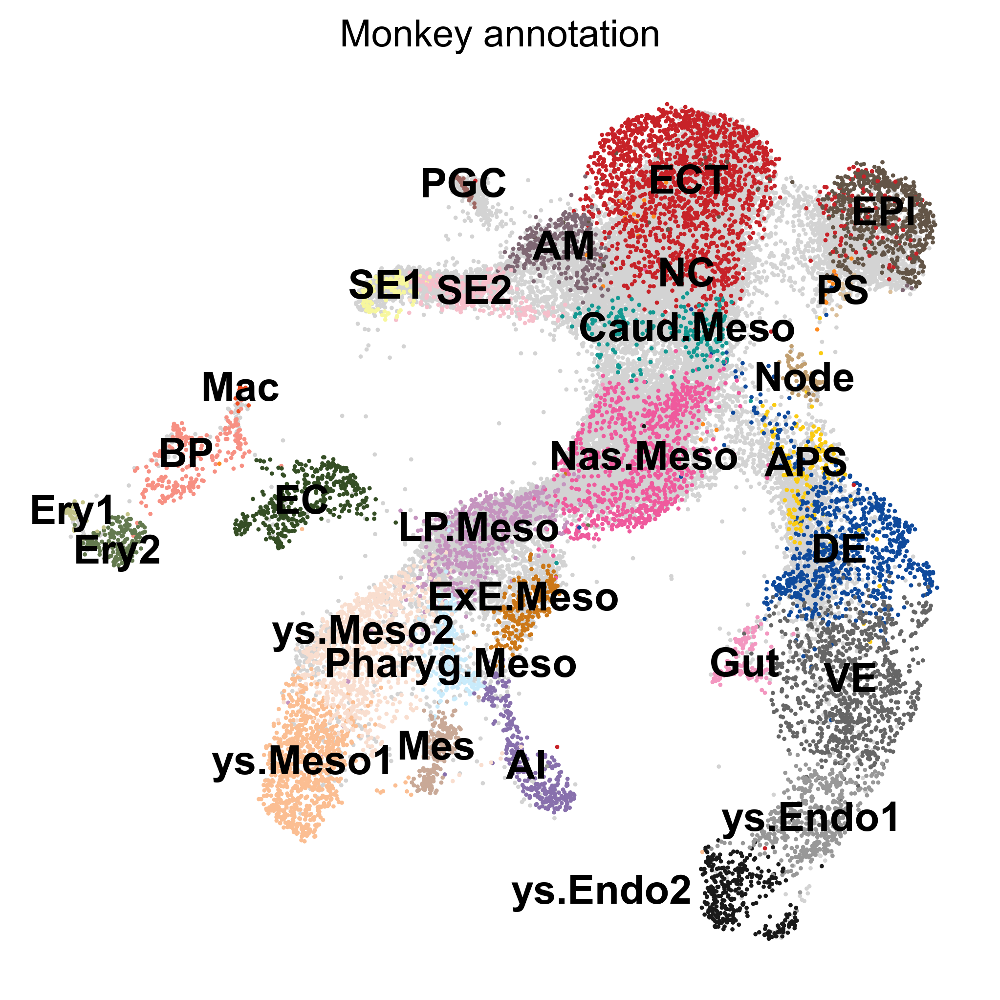

In [30]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 10,
    'legend.markerscale': 0.8,
    'font.size': 15 # This set size of axis label
}
plt.rcParams.update(styles)
fig, ax = plt.subplots(layout = "constrained", figsize = (5, 5))
sc.pl.embedding(
    adata_full, 
    color = ['Monkey annotation'], 
    basis='X_all2monkey',
    #na_color=[0.5, 0.5, 0.5],
    na_in_legend=False,
    size = 10, 
    frameon = False,
    palette = color_pallete_monkey,
    legend_loc = 'on data',
    ax = ax,
    show = False
    #save='all2monkey.png'
)
for te in ax.texts:
    if te.get_text() == 'ys.Meso2':
        te.set_y(2)
    elif te.get_text() == 'ys.Endo2':
        te.set_x(6.5)
    elif te.get_text() == 'Pharyg.Meso':
        te.set_y(1)
    elif te.get_text() == 'ExE.Meso':
        te.set_y(3)
    elif te.get_text() == 'Ery2':
        te.set_y(4.4)
    te.set_c([0, 0, 0, 1])
plt.show()
#plt.savefig("./figures_final/Monkey_annotation.png", dpi = 300)

In [75]:
import matplotlib
colormap = matplotlib.colormaps.get_cmap('tab10')

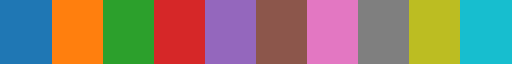

In [78]:
colormap

In [152]:
micropattern_color_palette_48_72h = {
    'pluripotent': colormap(0.15),
    'stressed': colormap(0.85),
    'APS-LC': colormap(0.35),
    'PPS-LC': colormap(0.25),
    'AE-LC': colormap(0.45),
    'PGC-LC': colormap(0.65),
    'DE': colormap(0.75),
    'NasMe': colormap(0.05),
    'AdvMe': colormap(0.55)
}
micropattern_color_palette_96h = {
    'pluripotent': colormap(0.15),
    'PM-LC': colormap(0.85),
    'APS-LC': colormap(0.35),
    'PS-LC': colormap(0.25),
    'AE-LC': colormap(0.45),
    'PGC-LC': colormap(0.65),
    'DE': colormap(0.75),
    'NasMe': colormap(0.05),
    'LPM-LC': colormap(0.55),
    'CS-LC': colormap(1.1)
}

In [91]:
mask = adata_full.obs['sample'].str.contains('48h')
adata_full.obs['Micropattern annotation 48h'] = pd.Categorical([n if mask[i] else 'Unknown' for i, n in enumerate(adata_full.obs['Micropattern annotation full'])]).remove_categories('Unknown')
mask = adata_full.obs['sample'].str.contains('72h')
adata_full.obs['Micropattern annotation 72h'] = pd.Categorical([n if mask[i] else 'Unknown' for i, n in enumerate(adata_full.obs['Micropattern annotation full'])]).remove_categories('Unknown')

In [271]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 10,
    'legend.markerscale': 0.8,
    'font.size': 15 # This set size of axis label
}
plt.rcParams.update(styles)
fig, ax = plt.subplots(layout = "constrained", figsize = (5, 5))
sc.pl.embedding(
    adata_full, 
    color = ['Micropattern annotation full'], 
    basis='X_all2monkey',
    na_in_legend=False,
    size = 10,
    frameon = False,
    legend_loc = 'on data',
    ax = ax,
    show = False,
    palette = micropattern_color_palette_48_72h
    #save='all2monkey.png'
)
for te in ax.texts:
    if te.get_text() == 'PGC-LC':
        te.set_x(te.get_position()[0] - 0.2)
        te.set_y(te.get_position()[1] + 0.2)
    elif te.get_text() == 'AdvMe':
        te.set_y(te.get_position()[1] - 0.8)
    elif te.get_text() == 'DE':
        te.set_y(te.get_position()[1] - 0.5)
        te.set_x(te.get_position()[0] + 0.3)
    elif te.get_text() == 'stressed':
        te.set_y(te.get_position()[1] + 2)
    elif te.get_text() == 'pluripotent':
        te.set_y(te.get_position()[1] - 0.5)
        te.set_x(te.get_position()[0] + 0.5)
    elif te.get_text() == 'APS-LC':
        te.set_y(te.get_position()[1] - 2)
    elif te.get_text() == 'PPS-LC':
        te.set_x(te.get_position()[0] - 0.5)
    te.set_c([0, 0, 0, 1])
plt.savefig("./figures_final/all_annotation.png", dpi = 300)

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


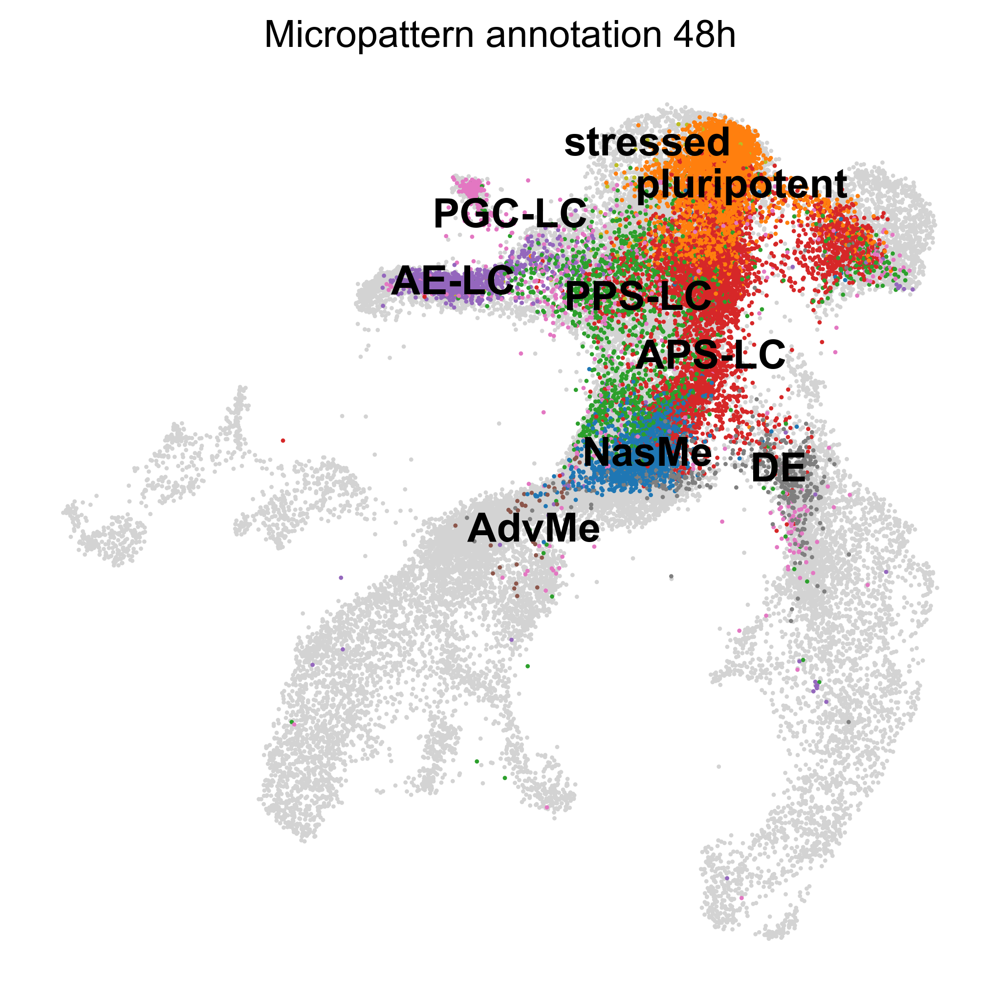

In [132]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 10,
    'legend.markerscale': 0.8,
    'font.size': 15 # This set size of axis label
}
plt.rcParams.update(styles)
fig, ax = plt.subplots(layout = "constrained", figsize = (5, 5))
sc.pl.embedding(
    adata_full, 
    color = ['Micropattern annotation 48h'], 
    basis='X_all2monkey',
    na_in_legend=False,
    size = 10,
    frameon = False,
    legend_loc = 'on data',
    ax = ax,
    show = False,
    palette = micropattern_color_palette_48_72h
    #save='all2monkey.png'
)
for te in ax.texts:
    if te.get_text() == 'PGC-LC':
        te.set_x(te.get_position()[0] - 1)
        te.set_y(te.get_position()[1] + 1)
    elif te.get_text() == 'AdvMe':
        te.set_y(te.get_position()[1] - 0.8)
    elif te.get_text() == 'DE':
        te.set_x(te.get_position()[0] + 0.5)
    elif te.get_text() == 'stressed':
        te.set_y(te.get_position()[1] + 1)
    elif te.get_text() == 'pluripotent':
        te.set_y(te.get_position()[1] - 0.5)
        te.set_x(te.get_position()[0] + 0.5)
    elif te.get_text() == 'APS-LC':
        te.set_y(te.get_position()[1] - 2.5)
    te.set_c([0, 0, 0, 1])
plt.savefig("./figures_final/48h_annotation.png", dpi = 300)

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


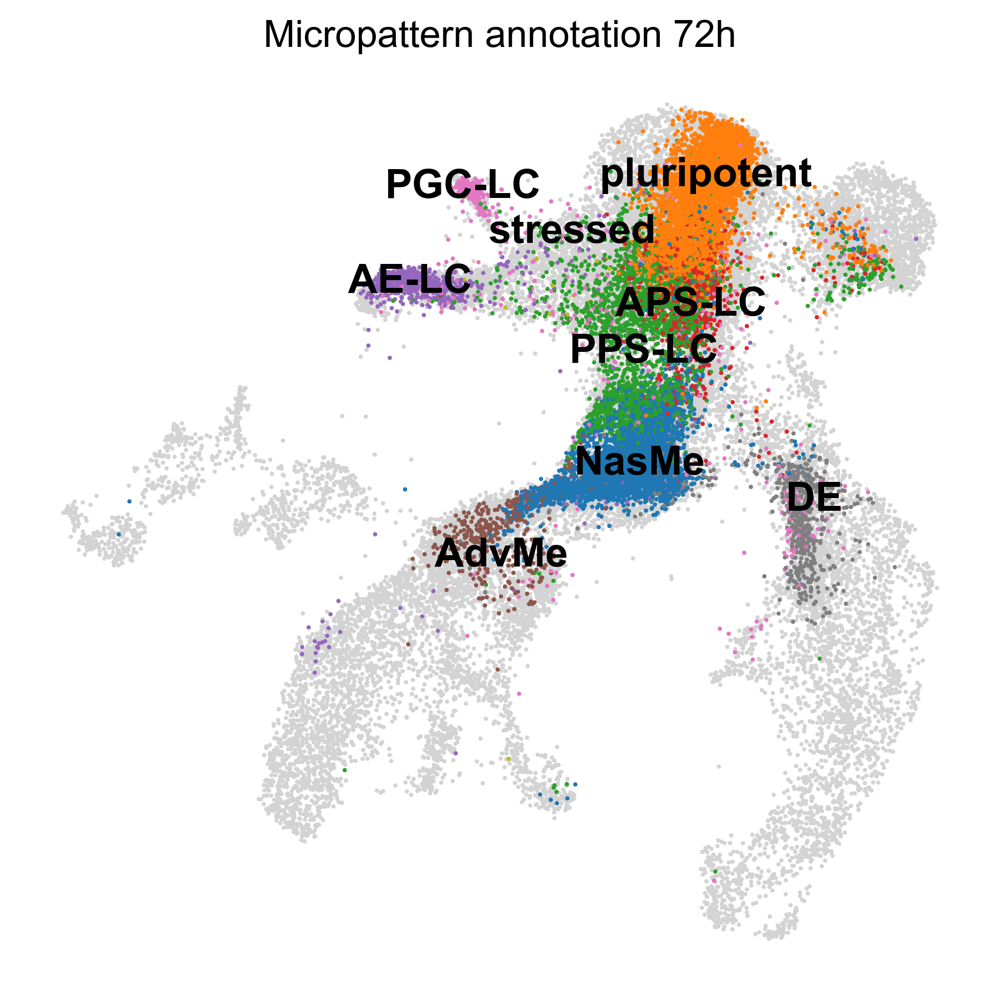

In [148]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 10,
    'legend.markerscale': 0.8,
    'font.size': 15 # This set size of axis label
}
plt.rcParams.update(styles)
fig, ax = plt.subplots(layout = "constrained", figsize = (5, 5))
sc.pl.embedding(
    adata_full, 
    color = ['Micropattern annotation 72h'], 
    basis='X_all2monkey',
    na_in_legend=False,
    size = 10,
    frameon = False,
    legend_loc = 'on data',
    ax = ax,
    show = False,
    palette = micropattern_color_palette_48_72h
    #save='all2monkey.png'
)
for te in ax.texts:
    if te.get_text() == 'PGC-LC':
        te.set_x(te.get_position()[0] - 0.2)
        te.set_y(te.get_position()[1] + 0.2)
    elif te.get_text() == 'AdvMe':
        te.set_y(te.get_position()[1] - 0.8)
    elif te.get_text() == 'DE':
        te.set_x(te.get_position()[0] + 0.5)
    elif te.get_text() == 'stressed':
        te.set_x(te.get_position()[0] - 2)
        te.set_y(te.get_position()[1] + 1)
    elif te.get_text() == 'pluripotent':
        te.set_y(te.get_position()[1] + 0.5)
        te.set_x(te.get_position()[0] + 0)
    elif te.get_text() == 'PPS-LC':
        te.set_y(te.get_position()[1] - 1)
    elif te.get_text() == 'APS-LC':
        te.set_y(te.get_position()[1] - 0.5)
    te.set_c([0, 0, 0, 1])
plt.savefig("./figures_final/72h_annotation.png", dpi = 300)

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


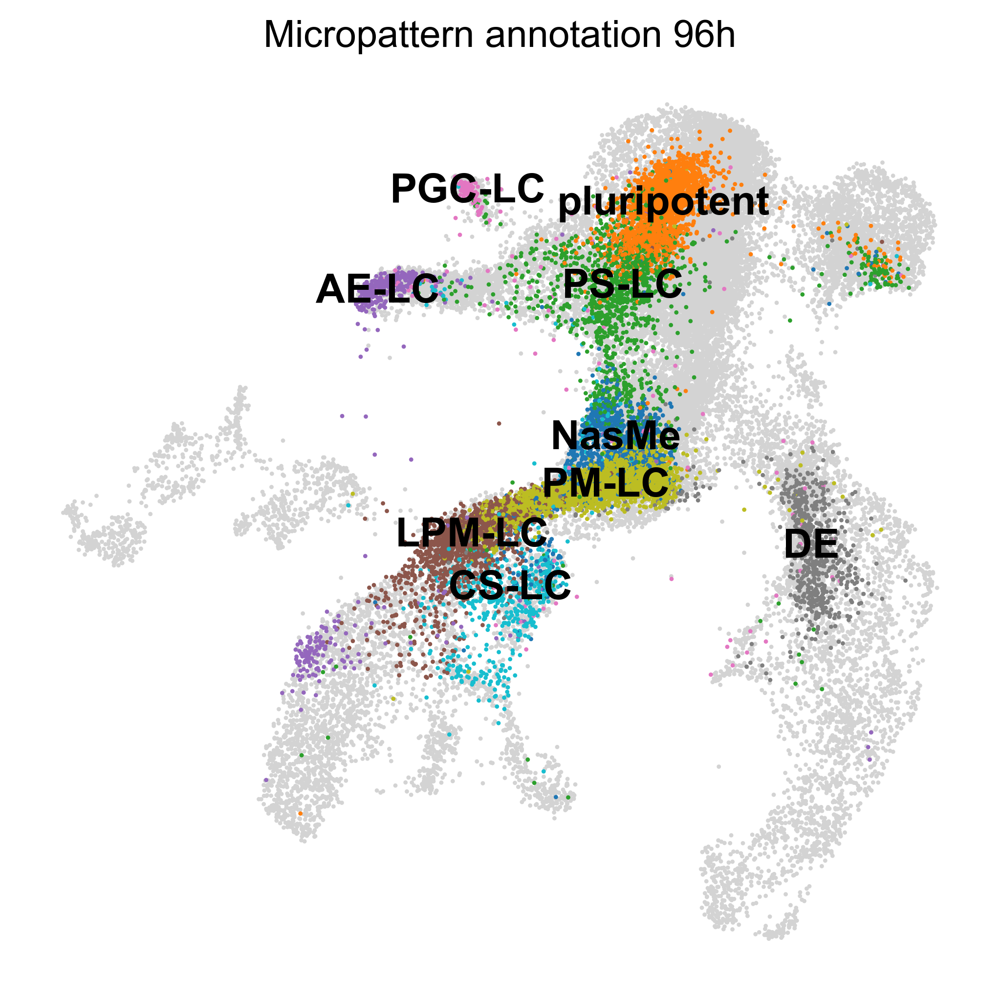

In [153]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 10,
    'legend.markerscale': 0.8,
    'font.size': 15 # This set size of axis label
}
plt.rcParams.update(styles)
fig, ax = plt.subplots(layout = "constrained", figsize = (5, 5))
sc.pl.embedding(
    adata_full, 
    color = ['Micropattern annotation 96h'], 
    basis='X_all2monkey',
    na_in_legend=False,
    size = 10,
    frameon = False,
    legend_loc = 'on data',
    ax = ax,
    show = False,
    palette = micropattern_color_palette_96h
    #save='all2monkey.png'
)
for te in ax.texts:
    if te.get_text() == 'NasMe':
        te.set_y(te.get_position()[1] + 0.8)
    te.set_c([0, 0, 0, 1])
#plt.show()
plt.savefig("./figures_final/96h_annotation.png", dpi = 300)

### Monkey labels on human

In [182]:
adata_tyser = sc.read_h5ad('updated_files/240229_adata_tyser_hvg.h5ad')
adata_tyser.var_names = pd.Index([g.split()[0] for g in adata_tyser.var_names])
trimmedfeaturenames = adata_tyser.var_names;
sharedfeat = list(set(trimmedfeaturenames) & set(adata_full.var_names));
adata_full_sub_human = adata_full[adata_full.obs['sample'] == 'human'].copy()

In [184]:
adata_full_sub_human.obs[sharedfeat] = adata_full_sub_human[:, sharedfeat].X.toarray().astype(int)
adata_tyser.obs[sharedfeat] = adata_tyser[:, sharedfeat].layers['counts'].toarray()

In [188]:
full_df = adata_full_sub_human.obs.copy()
human_df = adata_tyser.obs.copy()
merged_df = human_df.reset_index().merge(full_df, how = 'left', on = sharedfeat).set_index('index');
adata_tyser.obs = merged_df

In [252]:
embryonic_clusters = ['Pharyg.Meso', 'LP.Meso', 'Nas.Meso', 'Caud.Meso']
extra_embryonic_clusters = ['ys.Meso2', 'ys.Meso1', 'AI', 'ExE.Meso']
ununsed_clusters = list(set(adata_tyser.obs['knn_cell_type'].cat.categories) 
                        - set(embryonic_clusters) 
                        - set(extra_embryonic_clusters))
adata_tyser.obs['knn prediction human'] = adata_tyser.obs['knn_cell_type']
adata_tyser.obs['knn prediction human'] = adata_tyser.obs['knn prediction human'].cat.remove_categories(ununsed_clusters)
adata_tyser.obs['knn prediction human'] = adata_tyser.obs['knn prediction human'].cat.reorder_categories(embryonic_clusters[::-1] + extra_embryonic_clusters[::-1])
import matplotlib
colormap1 = matplotlib.colormaps.get_cmap('Oranges')
colormap2 = matplotlib.colormaps.get_cmap('Blues')
colors1 = colormap1(np.linspace(0.3, 0.8, len(embryonic_clusters)))
colors2 = colormap2(np.linspace(0.3, 0.8, len(extra_embryonic_clusters)))
colors = np.concatenate((colors1, colors2), 0)
color_dict = dict(zip(embryonic_clusters + extra_embryonic_clusters, colors))

In [278]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 15,
    'legend.markerscale': 0.8,
    'font.size': 15 # This set size of axis label
}
plt.rcParams.update(styles)
#fig, ax = plt.subplots(layout = "constrained")
sc.set_figure_params(figsize=[5,5], dpi_save=300)
sc.pl.umap(
    adata_tyser,
    color=["knn prediction human"],
    sort_order=False,
    frameon=False,
    #wspace=0.5,
    show = False,
    title='Monkey label transfer',
    #legend_loc='on data',
    #ax = ax,
    #na_color = [0.9, 0.9, 0.9, 0.5],
    na_in_legend=False,
    palette=color_dict,
    size=120,
    save = 'monkey_label_gradient.png'
)    
#ax.set_aspect("equal")
plt.show()
#plt.savefig("./figures_final/monkey_label_gradient.png", dpi = 300)

C:\Users\zhiyu\anaconda3\envs\scRNAseq\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [237]:
obs_tab = adata_full.obs[~pd.isna(adata_full.obs['leiden_sub'])].copy()
obs_tab['leiden_sub'] = obs_tab['leiden_sub'].cat.remove_categories("Unknown")
obs_summary = obs_tab.groupby(['leiden_sub', 'knn_cell_type'])[['cell_type']].count()
sample_cell_count = obs_summary.groupby('leiden_sub').transform(lambda x: x.sum())
obs_summary.cell_type = obs_summary.cell_type / sample_cell_count.cell_type * 100
heat_map = obs_summary.pivot_table(index = 'knn_cell_type', columns = 'leiden_sub')
heatmap_new = heat_map.loc[pd.Index(np.setdiff1d(heat_map.index.categories, ['BP', 'Ery1', 'Ery2', 'Mac', 'NC', 'ys.Endo1', 'ys.Endo2', 'Gut', 'AM', 'APS', 'DE', 'EC', 'ECT', 'EPI', 'PGC', 'PS', 'SE1', 'SE2', 'VE', 'Node', 'Mes'])), list(zip(['cell_type'] * 4, ['PM-LC', 'NasMe', 'LPM-LC', 'CS-LC']))].copy()

In [229]:
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [251]:
styles = {
    'font.family': 'arial',
    'font.weight': 'normal',
    'legend.fontsize': 30,
    'legend.markerscale': 0.8,
    'font.size': 50 # This set size of axis label
}
from matplotlib.colors import LogNorm, Normalize
plt.rcParams.update(styles)
fig, ax = plt.subplots(layout = "constrained", figsize = (15, 15))
sns.heatmap(np.round(heatmap_new, 2), annot=True, cbar=False, norm=LogNorm(vmin = 1, clip = True), ax = ax)
ax.set_xticklabels([j for (i, j) in heatmap_new.columns], rotation=0)
plt.yticks(rotation=0)
ax.set_xlabel('')
ax.set_ylabel('')
for text in ax.texts:
    text.set_fontweight('bold')
#plt.show()
plt.savefig("./figures_final/heatmap.png", dpi = 300)

### Expression plots

In [26]:
gene_list = ['PITX1', 'TBX4', 'DCN', 'ANXA1', 'ISL1', 'OTX2', 'MYL4', 'MYL7', 'SOX6']

In [34]:
# Transfer integrated represented to monkey
adata_monkey_CS8_expr.obsm['X_all2monkey'] = adata_full[adata_full.obs['sample'].str.contains('CS')].obsm['X_all2monkey']

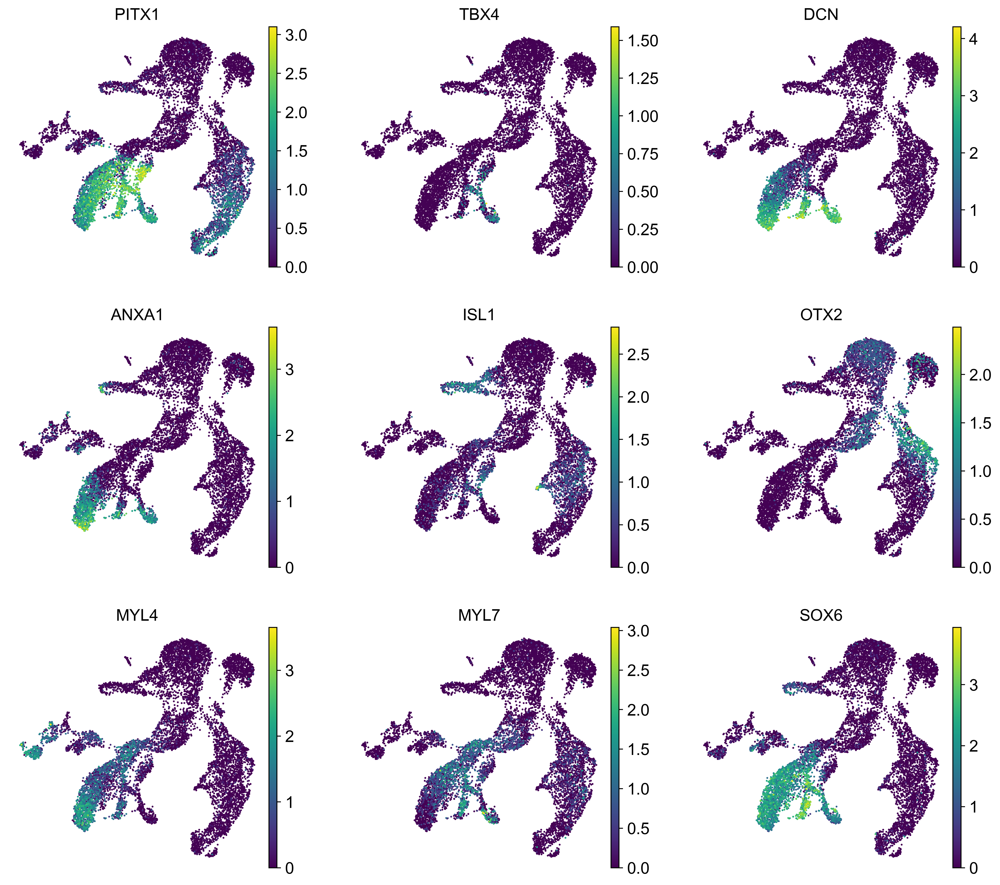

In [38]:
sc.pl.embedding(
    adata_monkey_CS8_expr, 
    color = gene_list, 
    basis='X_all2monkey',
    na_color=[0.5, 0.5, 0.5, 0.3],
    ncols=3,
    legend_fontsize=8,
    na_in_legend=False,
    size = 10,
    frameon = False
)

In [39]:
# Perform magic imputation on monkey's expression data
X_gene_list = magic.MAGIC(knn=5,t=1).fit_transform(adata_monkey_CS8_expr, genes=gene_list)

Calculating MAGIC...
  Running MAGIC on 11144 cells and 22717 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


C:\Users\zhiyu\AppData\Roaming\Python\Python312\site-packages\magic_impute-3.0.0-py3.12.egg\magic\magic.py:425: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  warnings.warn(


    Calculated PCA in 42.09 seconds.
    Calculating KNN search...
    Calculated KNN search in 6.07 seconds.
    Calculating affinities...
    Calculated affinities in 5.90 seconds.
  Calculated graph and diffusion operator in 54.07 seconds.
  Calculating imputation...
Calculated MAGIC in 54.30 seconds.


In [40]:
# Transfer integrated represented to magic output
X_gene_list.obsm['X_all2monkey'] = adata_monkey_CS8_expr.obsm['X_all2monkey']

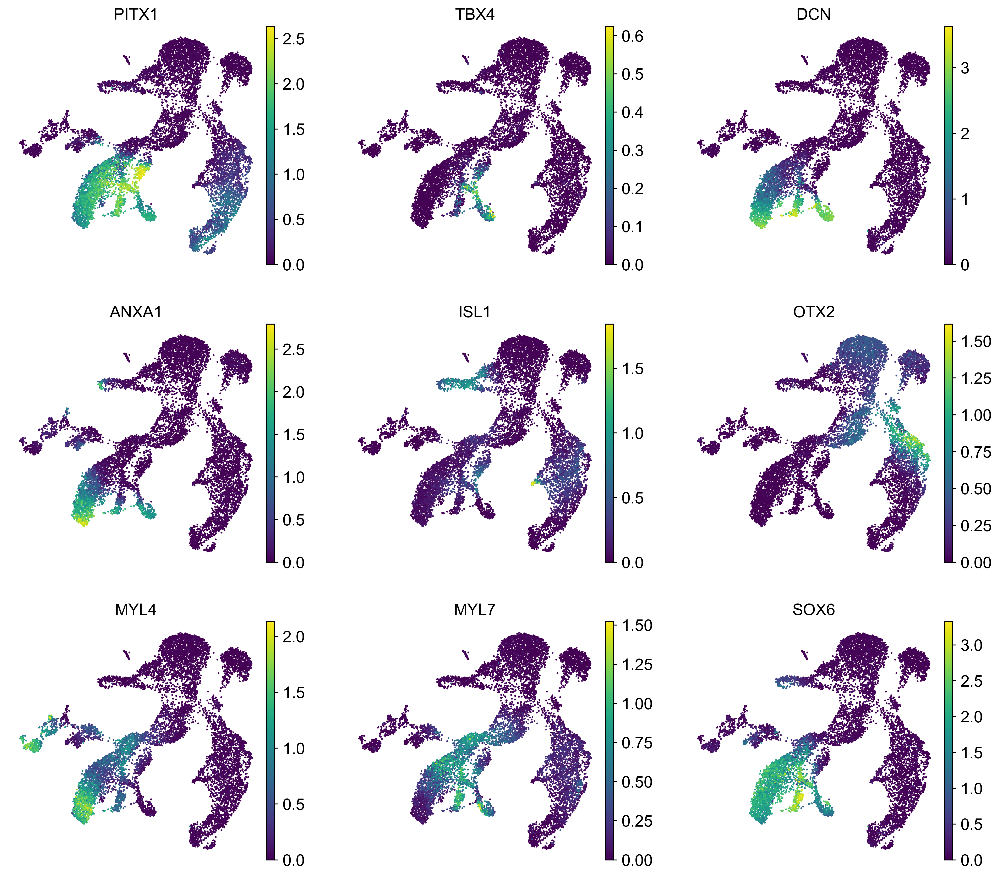

In [41]:
sc.pl.embedding(
    X_gene_list, 
    color = gene_list, 
    basis='X_all2monkey',
    na_color=[0.5, 0.5, 0.5, 0.3],
    ncols=3,
    legend_fontsize=8,
    na_in_legend=False,
    size = 10,
    frameon = False
)